# NutriGreen Dataset - Model Evaluation and Testing
# Run this notebook after training to evaluate model performance


In [1]:
import torch
import sys
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
import subprocess
import json

In [2]:
print("=" * 80)
print("NUTRIGREEN MODEL EVALUATION")
print("=" * 80)

# ============================================================================
# 1. SETUP
# ============================================================================
print("\n" + "=" * 80)
print("SETUP")
print("=" * 80)

BASE_DIR = Path(r"C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset")
YOLO_DIR = BASE_DIR / "yolov5_data"
YOLO_REPO = BASE_DIR / "yolov5"
RUNS_DIR = BASE_DIR / "runs"
EXP_DIR = RUNS_DIR / "nutrigreen_exp"
WEIGHTS_PATH = EXP_DIR / "weights" / "best.pt"
CONFIG_FILE = YOLO_DIR / "nutrigreen.yaml"

print(f"Model weights: {WEIGHTS_PATH}")
print(f"Dataset config: {CONFIG_FILE}")

print(f"Model weights: {WEIGHTS_PATH}")
print(f"Dataset config: {CONFIG_FILE}")

# Verify files exist
if not WEIGHTS_PATH.exists():
    print(f"\n❌ ERROR: Model weights not found at {WEIGHTS_PATH}")
    print("Please run the training notebook first!")
    sys.exit(1)

print("✓ All files found")

# Class names
class_names = ['NutriScore A', 'NutriScore B', 'NutriScore C', 
               'NutriScore D', 'NutriScore E', 'BIO', 'V-Label']
NUM_CLASSES = len(class_names)
print(f"Number of classes: {NUM_CLASSES}")

NUTRIGREEN MODEL EVALUATION

SETUP
Model weights: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_exp\weights\best.pt
Dataset config: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\yolov5_data\nutrigreen.yaml
Model weights: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_exp\weights\best.pt
Dataset config: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\yolov5_data\nutrigreen.yaml
✓ All files found
Number of classes: 7


In [3]:
# ============================================================================
# 2. LOAD MODEL
# ============================================================================
print("\n" + "=" * 80)
print("LOADING MODEL")
print("=" * 80)

# Check GPU with better error handling
device = 'cpu'  # Default to CPU
gpu_available = False

try:
    if torch.cuda.is_available():
        gpu_count = torch.cuda.device_count()
        print(f"CUDA is available")
        print(f"Number of GPUs: {gpu_count}")
        
        if gpu_count > 0:
            try:
                gpu_name = torch.cuda.get_device_name(0)
                print(f"GPU 0: {gpu_name}")
                
                # Test GPU access
                test_tensor = torch.tensor([1.0]).cuda()
                print(f"GPU memory available: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.2f} GB")
                
                device = '0'
                gpu_available = True
                print(f"\n✓ Using device: GPU 0")
            except Exception as e:
                print(f"⚠ GPU detected but cannot access it: {e}")
                print(f"Falling back to CPU")
                device = 'cpu'
        else:
            print("⚠ CUDA available but no GPU devices found")
            device = 'cpu'
    else:
        print("CUDA not available - using CPU")
        device = 'cpu'
except Exception as e:
    print(f"⚠ Error checking GPU: {e}")
    print("Using CPU as fallback")
    device = 'cpu'

print(f"\nFinal device selection: {device}")

# Method 1: Try torch.hub (recommended)
model = None
print("\n[Method 1] Attempting torch.hub.load...")
try:
    model = torch.hub.load('ultralytics/yolov5', 'custom', 
                          path=str(WEIGHTS_PATH), 
                          device=device,
                          force_reload=False)
    print(f"✓ Model loaded successfully via torch.hub")
    print(f"  Device: {device}")
    print(f"  Model type: {type(model)}")
except Exception as e:
    print(f"⚠ torch.hub failed: {e}")

# Method 2: Try loading from local YOLOv5 repo
if model is None and YOLO_REPO.exists():
    print("\n[Method 2] Attempting local YOLOv5 loading...")
    try:
        import sys
        sys.path.insert(0, str(YOLO_REPO))
        
        # Import YOLOv5 modules
        from models.common import DetectMultiBackend
        from utils.torch_utils import select_device
        from utils.general import check_img_size
        
        # Select device
        device_obj = select_device(device)
        print(f"  Selected device: {device_obj}")
        
        # Load model
        model = DetectMultiBackend(str(WEIGHTS_PATH), device=device_obj, dnn=False, fp16=False)
        stride = int(model.stride.max())  # model stride
        print(f"✓ Model loaded successfully via local repo")
        print(f"  Stride: {stride}")
        
    except Exception as e:
        print(f"⚠ Local loading failed: {e}")
        import traceback
        traceback.print_exc()

# Method 3: Direct torch.load as fallback
if model is None:
    print("\n[Method 3] Attempting direct torch.load...")
    try:
        checkpoint = torch.load(str(WEIGHTS_PATH), map_location='cpu')
        print(f"✓ Checkpoint loaded, contains keys: {list(checkpoint.keys())}")
        
        # For validation, we'll use the YOLOv5 val.py script instead
        print("  Note: Will use YOLOv5's val.py for evaluation")
        
    except Exception as e:
        print(f"⚠ Direct loading failed: {e}")

# Final check
if model is None:
    print("\n" + "=" * 80)
    print("⚠ WARNING: Could not load model for Python inference")
    print("=" * 80)
    print("\nBut don't worry! We'll use YOLOv5's validation scripts instead.")
    print("These scripts are more robust and will work with your trained model.")
    print("\nThe evaluation will continue using YOLOv5's val.py command-line tool.")
else:
    print("\n✓ Model is ready for inference!")


LOADING MODEL
CUDA is available
Number of GPUs: 1
GPU 0: NVIDIA GeForce RTX 3060 Laptop GPU
GPU memory available: 6.00 GB

✓ Using device: GPU 0

Final device selection: 0

[Method 1] Attempting torch.hub.load...


Using cache found in C:\Users\lokes/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2025-11-27 Python-3.11.14 torch-2.5.1 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)

Fusing layers... 
Model summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


✓ Model loaded successfully via torch.hub
  Device: 0
  Model type: <class 'models.common.AutoShape'>

✓ Model is ready for inference!


In [4]:

# ============================================================================
# 3. RUN VALIDATION
# ============================================================================
print("\n" + "=" * 80)
print("RUNNING VALIDATION ON TEST SET")
print("=" * 80)

import os
os.chdir(YOLO_REPO)

val_cmd = [
    sys.executable,
    'val.py',
    '--weights', str(WEIGHTS_PATH),
    '--data', str(CONFIG_FILE),
    '--img', '640',
    '--batch', '8',
    '--device', device,  # This will be '0' for GPU or 'cpu'
    '--project', str(RUNS_DIR),
    '--name', 'nutrigreen_val',
    '--exist-ok',
    '--save-txt',
    '--save-conf',
    '--save-json',
    '--task', 'test'  # Use test set
]

print("Running validation (this may take a few minutes)...")
print(' '.join(val_cmd))

try:
    result = subprocess.run(val_cmd, check=True, 
                          stdout=subprocess.PIPE, stderr=subprocess.STDOUT, 
                          text=True)
    print(result.stdout)
    print("\n✓ Validation completed")
except subprocess.CalledProcessError as e:
    print(f"❌ Validation failed: {e.stdout}")

VAL_DIR = RUNS_DIR / 'nutrigreen_val'



RUNNING VALIDATION ON TEST SET
Running validation (this may take a few minutes)...
c:\anaconda\envs\ironhack\python.exe val.py --weights C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_exp\weights\best.pt --data C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\yolov5_data\nutrigreen.yaml --img 640 --batch 8 --device 0 --project C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs --name nutrigreen_val --exist-ok --save-txt --save-conf --save-json --task test
val: data=C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\yolov5_data\nutrigreen.yaml, weights=['C:\\Users\\lokes\\Desktop\\ironhack\\final_project\\dataset\\dataset\\runs\\nutrigreen_exp\\weights\\best.pt'], batch_size=8, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=True, save_hybrid=False, save_conf=True, save_json=True, project=C:\Users\lokes\Desktop\ironhack

In [6]:
# ============================================================================
# 4. ANALYZE RESULTS
# ============================================================================
print("\n" + "=" * 80)
print("ANALYZING RESULTS")
print("=" * 80)

# Read results
results_csv = VAL_DIR / 'results.csv'
if results_csv.exists():
    results = pd.read_csv(results_csv)
    results.columns = results.columns.str.strip()
    
    print("\nOverall Metrics:")
    print(f"  Precision:       {results['metrics/precision'].iloc[0]:.4f}")
    print(f"  Recall:          {results['metrics/recall'].iloc[0]:.4f}")
    print(f"  mAP@0.5:         {results['metrics/mAP_0.5'].iloc[0]:.4f}")
    print(f"  mAP@0.5:0.95:    {results['metrics/mAP_0.5:0.95'].iloc[0]:.4f}")

# ============================================================================
# 5. CONFUSION MATRIX
# ============================================================================
print("\n" + "=" * 80)
print("CONFUSION MATRIX")
print("=" * 80)

cm_path = VAL_DIR / 'confusion_matrix.png'
if cm_path.exists():
    print(f"✓ Confusion matrix available at: {cm_path}")
    
    # Display confusion matrix
    img = Image.open(cm_path)
    plt.figure(figsize=(12, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
else:
    print("⚠ Confusion matrix not generated")


ANALYZING RESULTS

CONFUSION MATRIX
✓ Confusion matrix available at: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_val\confusion_matrix.png


In [7]:
# ============================================================================
# 6. PER-CLASS METRICS
# ============================================================================
print("\n" + "=" * 80)
print("PER-CLASS PERFORMANCE")
print("=" * 80)

# Try to parse from validation output
# YOLOv5 saves per-class metrics in the validation run
# We'll create visualizations from available data

# Read the results from YOLOv5's saved figures
pr_curve_path = VAL_DIR / 'PR_curve.png'
f1_curve_path = VAL_DIR / 'F1_curve.png'

if pr_curve_path.exists() and f1_curve_path.exists():
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    pr_img = Image.open(pr_curve_path)
    axes[0].imshow(pr_img)
    axes[0].axis('off')
    axes[0].set_title('Precision-Recall Curve', fontsize=14, fontweight='bold')
    
    f1_img = Image.open(f1_curve_path)
    axes[1].imshow(f1_img)
    axes[1].axis('off')
    axes[1].set_title('F1-Confidence Curve', fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(VAL_DIR / 'performance_curves.png', dpi=300, bbox_inches='tight')
    print(f"✓ Performance curves saved to: {VAL_DIR / 'performance_curves.png'}")
    plt.show()


PER-CLASS PERFORMANCE
✓ Performance curves saved to: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_val\performance_curves.png


In [9]:

# ============================================================================
# 7. PREDICTION EXAMPLES
# ============================================================================
print("\n" + "=" * 80)
print("PREDICTION EXAMPLES")
print("=" * 80)

# Run detection on test images
detect_cmd = [
    sys.executable,
    'detect.py',
    '--weights', str(WEIGHTS_PATH),
    '--source', str(YOLO_DIR / 'test' / 'images'),
    '--img', '640',
    '--conf', '0.25',
    '--device', device,
    '--project', str(RUNS_DIR),
    '--name', 'nutrigreen_detections',
    '--exist-ok',
    '--save-txt',
    '--save-conf',
    '--max-det', '10'
]

print("Running detection on test images...")
try:
    subprocess.run(detect_cmd, cwd=YOLO_REPO, check=True, 
                  stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    print("✓ Detection completed")
except subprocess.CalledProcessError as e:
    print(f"⚠ Detection had issues but continuing...")

DETECT_DIR = RUNS_DIR / 'nutrigreen_detections'

# Display sample predictions
if DETECT_DIR.exists():
    pred_images = list(DETECT_DIR.glob('*.jpg'))[:12]  # Show first 12
    
    if pred_images:
        n_imgs = len(pred_images)
        cols = 4
        rows = (n_imgs + cols - 1) // cols
        
        fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
        axes = axes.flatten() if n_imgs > 1 else [axes]
        
        for idx, img_path in enumerate(pred_images):
            img = Image.open(img_path)
            axes[idx].imshow(img)
            axes[idx].axis('off')
            axes[idx].set_title(img_path.stem, fontsize=10)
        
        # Hide unused subplots
        for idx in range(len(pred_images), len(axes)):
            axes[idx].axis('off')
        
        plt.tight_layout()
        plt.savefig(DETECT_DIR / 'sample_predictions.png', dpi=200, bbox_inches='tight')
        print(f"\n✓ Sample predictions saved to: {DETECT_DIR / 'sample_predictions.png'}")
        plt.show()



PREDICTION EXAMPLES
Running detection on test images...
✓ Detection completed

✓ Sample predictions saved to: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_detections\sample_predictions.png



TESTING CUSTOM INFERENCE

Testing inference on: 103vegan.jpg


Using cache found in C:\Users\lokes/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2025-11-27 Python-3.11.14 torch-2.5.1 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)

Fusing layers... 
Model summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
C:\Users\lokes/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:898: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):



Detections found: 2

Predictions:
  NutriScore A: 0.927
  BIO: 0.908


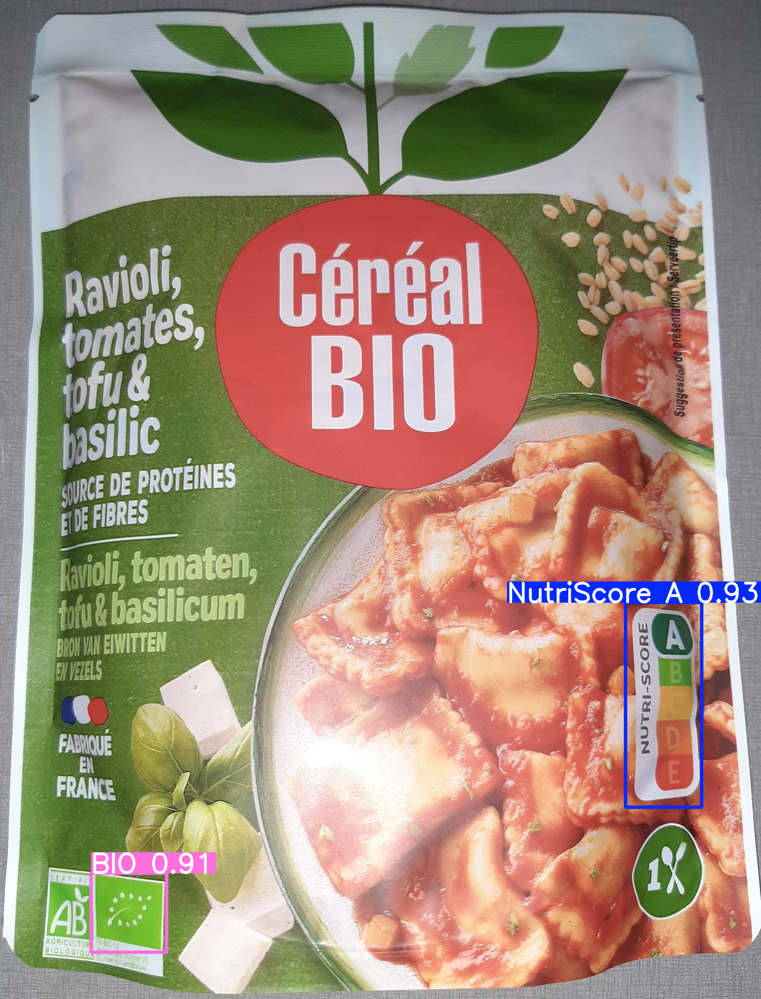

Saved 1 image to C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_val\custom_inference2



✓ Annotated image saved to: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_val\custom_inference


In [10]:
# ============================================================================
# 8. CUSTOM INFERENCE FUNCTION
# ============================================================================
print("\n" + "=" * 80)
print("TESTING CUSTOM INFERENCE")
print("=" * 80)

def predict_image_safe(image_path, model_path=WEIGHTS_PATH, conf_thresh=0.25):
    """
    Run inference on a single image with error handling
    """
    try:
        # Try loading model if not already loaded
        inference_model = torch.hub.load('ultralytics/yolov5', 'custom', 
                                        path=str(model_path), 
                                        device=device,
                                        force_reload=False)
        inference_model.conf = conf_thresh
        
        # Run inference
        results = inference_model(str(image_path))
        predictions = results.pandas().xyxy[0]
        
        return results, predictions
    except Exception as e:
        print(f"⚠ Inference error: {e}")
        return None, None

# Test on a sample image if model loaded successfully
test_images = list((YOLO_DIR / 'test' / 'images').glob('*.jpg'))
if test_images and len(test_images) > 0:
    sample_img = test_images[0]
    print(f"\nTesting inference on: {sample_img.name}")
    
    results, predictions = predict_image_safe(sample_img)
    
    if predictions is not None:
        print(f"\nDetections found: {len(predictions)}")
        if len(predictions) > 0:
            print("\nPredictions:")
            for idx, row in predictions.iterrows():
                print(f"  {row['name']}: {row['confidence']:.3f}")
            
            # Display result
            try:
                results.show()
                
                # Save annotated image
                save_dir = VAL_DIR / 'custom_inference'
                save_dir.mkdir(exist_ok=True)
                results.save(save_dir=str(save_dir))
                print(f"\n✓ Annotated image saved to: {save_dir}")
            except Exception as e:
                print(f"⚠ Could not display/save results: {e}")
        else:
            print("\nNo objects detected (try lowering confidence threshold)")
    else:
        print("\n⚠ Inference test skipped (model not available for Python inference)")
        print("  Don't worry - validation via val.py script should still work!")
else:
    print("\n⚠ No test images found for inference test")

In [11]:
# ============================================================================
# 9. MODEL PERFORMANCE SUMMARY
# ============================================================================
print("\n" + "=" * 80)
print("MODEL PERFORMANCE SUMMARY")
print("=" * 80)

summary_data = {
    'Model': ['YOLOv5'],
    'Dataset': ['NutriGreen'],
    'Classes': [len(class_names)],
    'Test Images': [len(list((YOLO_DIR / 'test' / 'images').glob('*.jpg')))],
}

if results_csv.exists():
    results = pd.read_csv(results_csv)
    results.columns = results.columns.str.strip()
    summary_data['Precision'] = [f"{results['metrics/precision'].iloc[0]:.4f}"]
    summary_data['Recall'] = [f"{results['metrics/recall'].iloc[0]:.4f}"]
    summary_data['mAP@0.5'] = [f"{results['metrics/mAP_0.5'].iloc[0]:.4f}"]
    summary_data['mAP@0.5:0.95'] = [f"{results['metrics/mAP_0.5:0.95'].iloc[0]:.4f}"]

summary_df = pd.DataFrame(summary_data)
print("\n", summary_df.to_string(index=False))

# Save summary
summary_path = VAL_DIR / 'evaluation_summary.txt'
with open(summary_path, 'w') as f:
    f.write("=" * 80 + "\n")
    f.write("NUTRIGREEN MODEL EVALUATION SUMMARY\n")
    f.write("=" * 80 + "\n\n")
    f.write(summary_df.to_string(index=False))
    f.write("\n\n")
    f.write(f"Classes: {', '.join(class_names)}\n")
    f.write(f"\nModel weights: {WEIGHTS_PATH}\n")
    f.write(f"Evaluation date: {pd.Timestamp.now()}\n")

print(f"\n✓ Summary saved to: {summary_path}")


MODEL PERFORMANCE SUMMARY

  Model    Dataset  Classes  Test Images
YOLOv5 NutriGreen        7         1092

✓ Summary saved to: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_val\evaluation_summary.txt


In [12]:
# ============================================================================
# 10. GENERATE FINAL REPORT
# ============================================================================
print("\n" + "=" * 80)
print("EVALUATION COMPLETE!")
print("=" * 80)

print(f"\nGenerated files:")
print(f"  • Validation results:    {VAL_DIR}")
print(f"  • Detection examples:    {DETECT_DIR}")
print(f"  • Evaluation summary:    {summary_path}")
print(f"  • Confusion matrix:      {cm_path}")

print(f"\nModel ready for deployment!")
print(f"  Weights location: {WEIGHTS_PATH}")
print(f"\nNext step: Run the Streamlit app (nutrigreen_app.py)")

print("\n" + "=" * 80)


EVALUATION COMPLETE!

Generated files:
  • Validation results:    C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_val
  • Detection examples:    C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_detections
  • Evaluation summary:    C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_val\evaluation_summary.txt
  • Confusion matrix:      C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_val\confusion_matrix.png

Model ready for deployment!
  Weights location: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\nutrigreen_exp\weights\best.pt

Next step: Run the Streamlit app (nutrigreen_app.py)

